In [1]:
# Store: https://shop.googlemerchandisestore.com/Google+Redesign/Google+Camp+Mug+White

In [2]:
#!pip install google-cloud-bigquery

In [3]:
#!pip install names

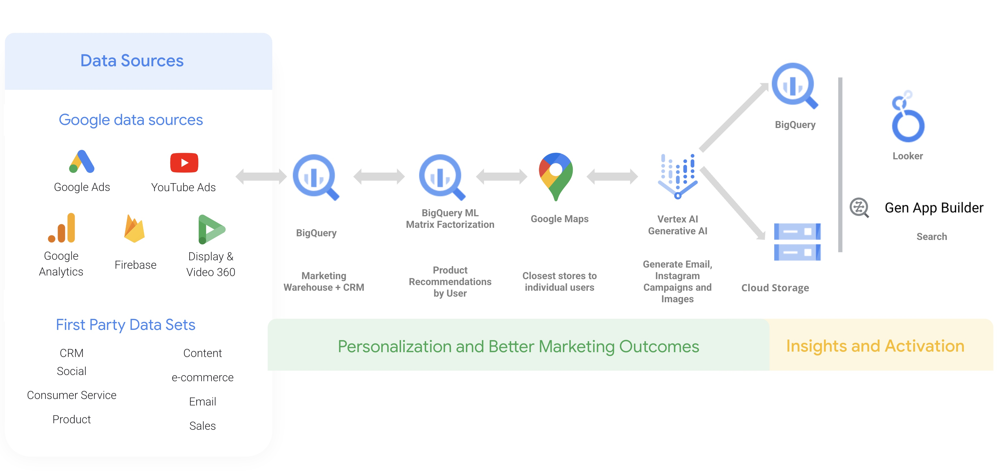

In [2]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "./"
Image(filename = PATH + "demo_arch.jpg", width="100%", height="100%")

In [2]:
# Automatically restart kernel after installs
import IPython
app = IPython.Application.instance()
#app.kernel.do_shutdown(True)  

In [3]:
PROJECT_ID = "<change-me>"
REGION = 'US'
location = 'us' # Format is 'us' or 'eu'
project_id = PROJECT_ID


llm_model_name = 'text-bison@001'
temperature = 0.2
max_decode_steps = 1024
top_p = 0.48
top_k = 13
llm_location = 'us-central1'
llm_tuned_model_name = ''
GCS_BUCKET='<change-me>'
SUBDIR='<change-me>'
US_REGION='us-central1'
bucket_name=GCS_BUCKET
table_id = '<schema>.<table>'
img_uri='https://storage.cloud.google.com/' + GCS_BUCKET + '/' + SUBDIR + '/generated/'


In [4]:
!rm ./images/*.jpg


In [5]:
import random
import names
import datetime 
import time

campaign_id=random.randint(1, 1000000)
campaign_time = datetime.datetime.now()
campaign_owner = names.get_full_name()
customer_name = names.get_full_name()
product_sku=random.randint(1, 1000000)
pnames = ["A", "B", "C", "D", "E", "F", "G"]
product_name = 'Product ' + random.choice(pnames) 
product_description = product_name + ' is a versatile product ...'

current_time = str(time.time())
current_time = current_time.replace('.', '_')

print(current_time)

print('Campaign ID: ' + str(campaign_id) + ' - ' + 'Campaign Date: ' + str(campaign_time) + ' - ' + 'Campaign Owner: ' + str(campaign_owner))

1686148508_3378017
Campaign ID: 415004 - Campaign Date: 2023-06-07 14:35:08.298708 - Campaign Owner: Jessica Birnbaum


In [6]:
from google.cloud import bigquery
import time
import pandas as pd

pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
#!bq mk --location=$REGION --dataset $PROJECT_ID:caugusto

## Raw data

Before beginning, take a look at the raw data:

In [8]:
%%bigquery --project $PROJECT_ID
## follows the Google Analytics schema: 
#https://support.google.com/analytics/answer/3437719?hl=en

SELECT 
  CONCAT(fullVisitorID,'-',CAST(visitNumber AS STRING)) AS visitorId,
  hitNumber,
  time,
  page.pageTitle,
  type,
  productSKU,
  v2ProductName,
  v2ProductCategory,
  productPrice/1000000 as productPrice_USD

FROM 
  `bigquery-public-data.google_analytics_sample.ga_sessions_20160801`, 
  UNNEST(hits) AS hits,
  UNNEST(hits.product) AS hits_product
LIMIT 5

Query is running:   0%|          |

Downloading:   0%|          |

,visitorId,hitNumber,time,pageTitle,type,productSKU,v2ProductName,v2ProductCategory,productPrice_USD
0,895954260133011192-1,1,0,Men's-T-Shirts,PAGE,GGOEGAAX0104,Google Men's 100% Cotton Short Sleeve Hero Tee...,Home/Apparel/Men's/Men's-T-Shirts/,16.990
1,895954260133011192-1,1,0,Men's-T-Shirts,PAGE,GGOEGAAX0105,Google Men's 100% Cotton Short Sleeve Hero Tee...,Home/Apparel/Men's/Men's-T-Shirts/,16.990
2,895954260133011192-1,1,0,Men's-T-Shirts,PAGE,GGOEGAAX0107,Google Men's 100% Cotton Short Sleeve Hero Tee...,Home/Apparel/Men's/Men's-T-Shirts/,16.990
3,895954260133011192-1,1,0,Men's-T-Shirts,PAGE,GGOEGAAX0106,Google Men's 100% Cotton Short Sleeve Hero Tee...,Home/Apparel/Men's/Men's-T-Shirts/,16.990
4,895954260133011192-1,1,0,Men's-T-Shirts,PAGE,GGOEGAAX0340,Google Men's Vintage Badge Tee Green,Home/Apparel/Men's/Men's-T-Shirts/,16.990


## Pre-process the data

With collaborative filtering (matrix factorization), the dataset must indicate a user's preference for a product, like a rating between 1 and 5 stars. However, in the retail industry, there is usually no or insufficient explicit feedback on how much a user liked a product. Thus, other behavioral metrics need to be used to infer their implicit "rating".  One way to infer user interest in a product is to look at the total time spent on a product detail page (e.g., session duration).

With matrix factorization, in order to train the model, you will need a table with `userId`, `itemId`, and the `rating`. In this notebook example, session duration will be used as the implicit rating. If you have other metrics (e.g., frequency of pageviews), you can simply combine the metrics together using a weighted sum to compute a rating value.

|userId|itemId|rating|
|-|-|-|
|visitor1|productSKU_1|3000|
|visitor1|productSKU_4|15000|
|visitor1|productSKU_9|920|
|visitor2|productSKU_12|0|

Notice how every row is a unique combination of userId and itemId, along with the (implicit) rating.

The query below will pre-process the data by calculating the total pageview duration per product per user, and materialize the data in a new table, `aggregate_web_stats`.

In [13]:
%%bigquery --project $PROJECT_ID
## follows schema from https://support.google.com/analytics/answer/3437719?hl=en&ref_topic=3416089
CREATE OR REPLACE TABLE caugusto.aggregate_web_stats AS (
  WITH
    durations AS (
      --calculate pageview durations
      SELECT
        CONCAT(fullVisitorID,'-', 
             CAST(visitNumber AS STRING),'-', 
             CAST(hitNumber AS STRING) ) AS visitorId_session_hit,
        LEAD(time, 1) OVER (
          PARTITION BY CONCAT(fullVisitorID,'-',CAST(visitNumber AS STRING))
          ORDER BY
          time ASC ) - time AS pageview_duration
      FROM
        `bigquery-public-data.google_analytics_sample.ga_sessions_2016*`,
        UNNEST(hits) AS hit 
    ),
      
    prodview_durations AS (
      --filter for product detail pages only
      SELECT
        CONCAT(fullVisitorID,'-',CAST(visitNumber AS STRING)) AS visitorId,
        productSKU AS itemId,
        IFNULL(dur.pageview_duration,
          1) AS pageview_duration,
      FROM
        `bigquery-public-data.google_analytics_sample.ga_sessions_2016*` t,
        UNNEST(hits) AS hits,
        UNNEST(hits.product) AS hits_product
      JOIN
        durations dur
      ON
        CONCAT(fullVisitorID,'-',
               CAST(visitNumber AS STRING),'-',
               CAST(hitNumber AS STRING)) = dur.visitorId_session_hit
      WHERE
      #action_type: Product detail views = 2
      eCommerceAction.action_type = "2" 
    ),
    
    aggregate_web_stats AS(
      --sum pageview durations by visitorId, itemId
      SELECT
        visitorId,
        itemId,
        SUM(pageview_duration) AS session_duration
      FROM
        prodview_durations
      GROUP BY
        visitorId,
        itemId )
    SELECT
      *
    FROM
      aggregate_web_stats
);
-- Show table
SELECT
  *
FROM
  caugusto.aggregate_web_stats
LIMIT
  10

Query is running:   0%|          |

Downloading:   0%|          |

,visitorId,itemId,session_duration
0,651786729856403067-1,GGOEGAAX0031,17981
1,6261323644020670529-2,GGOEGAAX0031,2050
2,6093460462585785210-1,GGOEGAAX0031,9309
3,9979229817860302312-4,GGOEGAAX0031,3511
4,011585208349878934-1,GGOEGAAX0031,8777
5,0482127468445783797-2,GGOEGAAX0031,20110
6,9151829799099043221-1,GGOEGAAX0031,2114
7,5468761641774363851-1,GGOEGAAX0031,59
8,6044777634082342578-1,GGOEGAAX0031,47836
9,9072756856133512557-1,GGOEGAAX0031,2701


### The training data

With the data stored in an output table in the correct format for matrix factorization, the data is now ready for training a matrix factorization model.

In [12]:
%%bigquery --project $PROJECT_ID

SELECT
  *
FROM
  caugusto.aggregate_web_stats
LIMIT 
  10

Query is running:   0%|          |

Downloading:   0%|          |

,visitorId,itemId,session_duration
0,190011494569463670-1,GGOEGAAX0031,9711
1,7131184833921807733-1,GGOEGAAX0031,2970
2,4265879451785909860-1,GGOEGAAX0031,27617
3,9415829283766056542-3,GGOEGAAX0031,5330
4,5515350445753934486-2,GGOEGAAX0031,4686
5,3187471463012192872-1,GGOEGAAX0031,22183
6,9465622574731169620-1,GGOEGAAX0031,16340
7,3498159272116659933-9,GGOEGAAX0031,4360
8,7641957624363570840-1,GGOEGAAX0031,32664
9,9924326037964934443-1,GGOEGAAX0031,11451


## Train the matrix factorization model

To train the matrix factorization model (with implicit feedback), you will need to set the options:
* `model_type`: `'matrix_factorization'` 
* `user_col`: \<user column name>
* `item_col`: \<item column name>
* `rating_col`: \<rating column name>
* `feedback_type`: `'implicit'` (default is 'explicit')

To learn more about the parameters when training a model, read the [documentation on the CREATE MODEL statement for Matrix Factorization](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-matrix-factorization).

_Note: You may need to setup slot reservations. For more information, you can read up on how to set up flex slots [programmatically](https://medium.com/google-cloud/optimize-bigquery-costs-with-flex-slots-e06ec5e4aa90) or via the [BigQuery UI](https://cloud.google.com/bigquery/docs/reservations-workload-management#getting-started-with-bigquery-reservations)._

In [ ]:
%%bigquery --project $PROJECT_ID

CREATE OR REPLACE MODEL caugusto.retail_recommender
OPTIONS(model_type='matrix_factorization', 
        user_col='visitorId', 
        item_col='itemId',
        rating_col='session_duration',
        feedback_type='implicit'
        )
AS
SELECT * FROM caugusto.aggregate_web_stats

## Model Evaluation

Inspect the resulting metrics from model evaluation.

For more information on these metrics, read the [ML.EVALUATE documentation here](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-evaluate).

In [14]:
%%bigquery --project $PROJECT_ID

SELECT
  *
FROM
  ML.EVALUATE(MODEL caugusto.retail_recommender)

Query is running:   0%|          |

Downloading:   0%|          |

,mean_average_precision,mean_squared_error,normalized_discounted_cumulative_gain,average_rank
0,0.012,57922295.361,0.857,0.279


## Hyperparameter Tuning

If you want to improve your model,  some of the hyperparameters you can tune are:
* `NUM_FACTORS`: Specifies the number of latent factors to use for matrix factorization models (int64_value)
* `L2_REG`: The amount of L2 regularization applied (float64_value)
* `WALS_ALPHA`: A hyperparameter for 'IMPLICIT' matrix factorization model (float64_value)

See the official documentation on [CREATE MODEL (matrix factorization)](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-matrix-factorization) for more information on hyperparameter tuning.

## Make predictions

### Inspect the predicted recommendations for a single user

#### What are the top 5 items you could recommend to a specific visitorId?

In [15]:
%%bigquery --project $PROJECT_ID

#check for a single visitor
DECLARE MY_VISITORID STRING DEFAULT "0824461277962362623-1";

SELECT
  *
FROM
  ML.RECOMMEND(MODEL `caugusto.retail_recommender`,
      (SELECT MY_VISITORID as visitorID)
              )
ORDER BY predicted_session_duration_confidence DESC
LIMIT 5

Query is running:   0%|          |

Downloading:   0%|          |

,predicted_session_duration_confidence,visitorId,itemId
0,20576.898,0824461277962362623-1,GGOEGGOA017399
1,20182.911,0824461277962362623-1,GGOEGAAX0317
2,19442.827,0824461277962362623-1,GGOEYOLR018699
3,18489.221,0824461277962362623-1,GGOEGBJC076099
4,16120.375,0824461277962362623-1,GGOEGDHQ015399


What are the names of the recommended products? Discover the product names by joining the resulting productSKU recommendations back with the product names:

In [15]:
%%bigquery --project $PROJECT_ID

DECLARE MY_VISITORID STRING DEFAULT "6499749315992064304-2";

WITH product_details AS(
    SELECT 
        productSKU,
        v2ProductName,
    FROM 
        `bigquery-public-data.google_analytics_sample.ga_sessions_2016*`,
        UNNEST(hits) AS hits,
        UNNEST(hits.product) AS hits_product
    GROUP BY 2,1 
)

SELECT
  r.*,
  d.v2ProductName
FROM
  ML.RECOMMEND(MODEL `caugusto.retail_recommender`,
      (
      SELECT
       MY_VISITORID as visitorId)) r
JOIN
  product_details d
ON
  r.itemId = d.productSKU
ORDER BY predicted_session_duration_confidence DESC
LIMIT 5

Query is running:   0%|          |

Downloading:   0%|          |

,predicted_session_duration_confidence,visitorId,itemId,v2ProductName
0,108310.699,6499749315992064304-2,GGOEGDHQ015399,26 oz Double Wall Insulated Bottle
1,93377.355,6499749315992064304-2,GGOEGAAX0358,Google Men's Zip Hoodie
2,81353.432,6499749315992064304-2,GGOEGGOA017399,Maze Pen
3,67167.135,6499749315992064304-2,GGOEGAAX0319,Android Men's Short Sleeve Hero Tee Heather
4,56984.749,6499749315992064304-2,GGOEGCNB021099,Seat Pack Organizer


### Batch predictions for all users

To retrieve the top 5 recommended products for all existing users, run the following query. As the result can be large (num_users * num_products * top N), this also outputs the recommendations to a separate table.

In [16]:
%%bigquery --project $PROJECT_ID

-- Create output table
CREATE OR REPLACE TABLE caugusto.prod_recommendations AS (
WITH predictions AS (
    SELECT 
      visitorId, 
      ARRAY_AGG(STRUCT(itemId, 
                       predicted_session_duration_confidence)
                ORDER BY 
                  predicted_session_duration_confidence DESC
                LIMIT 5) as recommended
    FROM ML.RECOMMEND(MODEL caugusto.retail_recommender)
    GROUP BY visitorId
)
    

SELECT
  visitorId,
  itemId,
  predicted_session_duration_confidence
FROM
  predictions p,
  UNNEST(recommended)
);

-- Show table
SELECT
  *
FROM
  caugusto.prod_recommendations
ORDER BY 
  visitorId
LIMIT
  20

Query is running:   0%|          |

Downloading:   0%|          |

,visitorId,itemId,predicted_session_duration_confidence
0,0000010278554503158-1,GGOEGBJC076099,18368.262
1,0000010278554503158-1,GGOEGGOA017399,19014.585
2,0000010278554503158-1,GGOEGAAX0317,19798.893
3,0000010278554503158-1,GGOEYOLR018699,18091.608
4,0000010278554503158-1,GGOEGBJL013999,15302.358
5,0000020424342248747-1,GGOEGBRB013899,19982.775
6,0000020424342248747-1,GGOEGBJL013999,18601.588
7,0000020424342248747-1,GGOEGOLC013299,18227.432
8,0000020424342248747-1,GGOEGBJC076099,18699.145
9,0000020424342248747-1,GGOEGAAX0317,19222.122


#### 2-1. Read from the predictions directly from BigQuery

With the predictions stored in a separate table, you can export the data into a Pandas dataframe using the BigQuery Storage API (see [documentation and code samples](https://cloud.google.com/bigquery/docs/bigquery-storage-python-pandas#download_table_data_using_the_client_library)). You can also use other [BigQuery client libraries](https://cloud.google.com/bigquery/docs/reference/libraries). 

Alternatively you can also export directly into pandas in a notebook using the `%%bigquery <variable name>` as in:

In [16]:
%%bigquery df --project $PROJECT_ID
SELECT
  *
FROM 
  caugusto.prod_recommendations
LIMIT 100

Query is running:   0%|          |

Downloading:   0%|          |

In [17]:
df.head(10)

,visitorId,itemId,predicted_session_duration_confidence
0,4622463317898800871-3,GGOEGBJL013999,21262.262
1,5966742033563358133-1,GGOEYOLR018699,15383.054
2,6961227855712357224-1,GGOEGGOA017399,20002.335
3,4636139656248532582-3,GGOEGGOA017399,26711.964
4,8518740059623315737-3,GGOEGAAX0317,18396.608
5,0591820689738311862-1,GGOEGBRB013899,38193.352
6,4128320788285302971-1,GGOEGGOA017399,19389.778
7,8234578431980225639-2,GGOEGAAX0317,20399.053
8,1150463215911526566-1,GGOEGGOA017399,20450.966
9,8813917931670846127-8,GGOEGGOA017399,30941.378


## Starting Gen AI Section ... Lets focus on scraping webpage for recommended product GGOEGDNC172699

In [ ]:
# 1. Import the requests library
import requests

#URL = "https://instagram.com/favicon.ico"
#response = requests.get(URL)
#open("instagram.ico", "wb").write(response.content)

URL = "https://www.target.com/p/flybird-baja-pina-colada-wine-cocktail-750ml-bottle/-/A-84738949#lnk=sametab"
response = requests.get(URL)
url_content=''
if response.status_code == 200:
    # The request was successful
    content = response.content
    url_content = response.content
    print(content)
else:
    # The request failed
    print('Request failed with status code {}'.format(response.status_code))

    


In [10]:
#$ apt-get install python3-bs4 (for Python 3)
import bs4
import urllib.request
import html.parser
from html.parser import HTMLParser


webpage=str(urllib.request.urlopen(URL).read())
soup = bs4.BeautifulSoup(webpage)


title = soup.find('title')
section_content= 'Product Name: ' + title.string + '\n'

#print(title.string) # Prints the tag string content

mydiv = ''

divs = soup.find_all('div', class_='styles__StyledCol-sc-fw90uk-0 hOcoMD h-padding-t-x2 h-padding-r-tight')
section_content+=str(divs)

#divs = soup.find_all('div', id='tabContent-tab-Details')
#section_content+=str(divs)
    
print(section_content)

#html = parser.parse(content)
#fixed_html = fix_html(html)


Product Name: Flybird Baja Pina Colada Wine Cocktail - 750ml Bottle : Target
[<div class="styles__StyledCol-sc-fw90uk-0 hOcoMD h-padding-t-x2 h-padding-r-tight"><li class="styles__Bullet-sc-6aebpn-0 bTWoMB"><span>Hecho en Jalisco, Mexico</span></li></div>, <div class="styles__StyledCol-sc-fw90uk-0 hOcoMD h-padding-t-x2 h-padding-r-tight"><li class="styles__Bullet-sc-6aebpn-0 bTWoMB"><span>Made with 100% Blue Weber Agave wine &amp; all-natural ingredients. No artificial colors or sweeteners used.</span></li></div>, <div class="styles__StyledCol-sc-fw90uk-0 hOcoMD h-padding-t-x2 h-padding-r-tight"><li class="styles__Bullet-sc-6aebpn-0 bTWoMB"><span>15% ABV &amp; Gluten-Free</span></li></div>, <div class="styles__StyledCol-sc-fw90uk-0 hOcoMD h-padding-t-x2 h-padding-r-tight"><li class="styles__Bullet-sc-6aebpn-0 bTWoMB"><span>All-Natural Ingredients: Coconut Juice, Pineapple Juice, Cane Sugar, Agave Wine, Water. No artificial colors or sweeteners used.</span></li></div>, <div class="style

# Google Maps Integration - Using Customer Address (CRM data), find stores closest to the customer

In [11]:
#!pip install googlemaps

In [12]:

import requests
import json

location_list=[]

#1000 meters = 6 miles
url = "https://maps.googleapis.com/maps/api/place/nearbysearch/json?location=28.689130%2C-81.213840&radius=12000&type=department_store&keyword=target&key=<change-me>"

payload={}
headers = {}

response = requests.request("GET", url, headers=headers, data=payload)
json_response=json.loads(response.text)

#print(response.text)
#print(json_response['results'][0]['name'])
#print(json_response['results'][0]['vicinity'])
#print(json_response['results'][0]['geometry']['location'])

for result in json_response["results"]:
    #print( result["name"] + ': ' + result["vicinity"] + ', FL' )
    location_list.append(result["name"] + ': ' + result["vicinity"] + ', FL')

print(str(location_list))    
#  print(result["vicinity"])
#  print(result['geometry']['location'])



['Target: 820 Oviedo Mall Boulevard, Oviedo, FL', 'Target: 3770 N Goldenrod Rd, Winter Park, FL', 'Target: 1201 WP Ball Blvd, Sanford, FL']


## Personalized Emails promoting local stores (Product and Location Focused)

In [13]:
import vertexai
from vertexai.preview.language_models import TextGenerationModel
import datetime


def predict_large_language_model_sample(
    project_id: str,
    model_name: str,
    temperature: float,
    max_decode_steps: int,
    top_p: float,
    top_k: int,
    content: str,
    location: str = "us-central1",
    tuned_model_name: str = "",
    ) :
    """Predict using a Large Language Model."""
    vertexai.init(project=project_id, location=location)
    model = TextGenerationModel.from_pretrained(model_name)
    if tuned_model_name:
      model = model.get_tuned_model(tuned_model_name)
    response = model.predict(
        content,
        temperature=temperature,
        max_output_tokens=max_decode_steps,
        top_k=top_k,
        top_p=top_p,)
    #print(f"Response from Model: {response.text}")
    #print(f"{response.text}")
    return response.text



prompt=f"""
You are a creative marketing designer for company Bacardi. Create an email promoting the product in the text to customer {customer_name}. 
Add text "10% discount with coupon SAVE10" to the response.

List stores near the customer:
{location_list}

text:
{section_content}


"""

#print(prompt)


temperature = 0.4
max_decode_steps = 1024
top_p = 0.8
top_k = 40

llm_response=predict_large_language_model_sample(project_id, llm_model_name, temperature, max_decode_steps, top_p, top_k, prompt)
email_campaign=llm_response

print('')
print('Response:')
print(llm_response)



Response:
Donna France,

We hope you're enjoying your summer! To help you cool down, we're offering 10% off Flybird Baja Pina Colada Wine Cocktail. This delicious cocktail is made with 100% Blue Weber Agave wine and all-natural ingredients, and it's gluten-free and 15% ABV. It's perfect for enjoying on the rocks or blended.

Find Flybird Baja Pina Colada Wine Cocktail at the following stores near you:

* Target: 820 Oviedo Mall Boulevard, Oviedo, FL
* Target: 3770 N Goldenrod Rd, Winter Park, FL
* Target: 1201 WP Ball Blvd, Sanford, FL

Just use the coupon code SAVE10 at checkout.

Cheers,
The Bacardi Team


## One-Sentence Ad Copies creation using Gen AI

In [14]:

prompt=f"""
For each of the following categories, create 3 one-sentence ad copies using the product description provided.

Categories:
- Scarcity
- Loss-Aversion
- Appeal to Ego
- Exclusivity
- Gain-Seeking
- Luxury
- Social Proof
- Influencer Proof
- Positive Association
- Negative Association

Product Description:
{section_content}
"""

#print(prompt)


temperature = 0.4
max_decode_steps = 1024
top_p = 0.3
top_k = 40

llm_response=predict_large_language_model_sample(project_id, llm_model_name, temperature, max_decode_steps, top_p, top_k, prompt)

print('')
print('Response:')
print(llm_response)



Response:
**Scarcity**

* **Only 100 bottles left! Get yours before it's too late.**
* **This limited-edition pina colada wine cocktail is sure to sell out fast.**
* **Don't miss out on this delicious and refreshing drink. Order yours today!**

**Loss-Aversion**

* **Don't miss out on this amazing pina colada wine cocktail. It's so good, you'll regret it if you don't try it.**
* **This is the perfect drink to enjoy on a hot summer day. It's so refreshing, you'll feel like you're on vacation.**
* **This pina colada wine cocktail is so delicious, you'll want to drink it all day long.**

**Appeal to Ego**

* **This pina colada wine cocktail is the perfect drink to impress your friends and family.**
* **This is the drink that everyone will be talking about. Order yours today and be the envy of all your friends.**
* **This pina colada wine cocktail is so delicious, you'll feel like a VIP when you drink it.**

**Exclusivity**

* **This pina colada wine cocktail is only available for a limit

## Create an Instagram Campaign using Product Details. Return Using JSON Format

In [15]:
prompt=f"""
Create an exclusivity instagram marketing campaign using information from the product at https://www.target.com/p/flybird-baja-pina-colada-wine-cocktail-750ml-bottle/-/A-84738949#lnk=sametab. 
For image description, generate a very detailed movie scene.

Reply using json format. json example:
{{
"image_description": "xxx",
"caption": "xxx",
"call_to_action": "xxx",
"hastags": "xxx"
}}


Product Description:
{section_content}
"""

#print(prompt)


temperature = 0.7
max_decode_steps = 1024
top_p = 0.8
top_k = 40

llm_response=predict_large_language_model_sample(project_id, llm_model_name, temperature, max_decode_steps, top_p, top_k, prompt)

print('')
print('Response:')
print(llm_response)

llminsta_json=llm_response

if llminsta_json.startswith("```"):
    imgprompt = 'Birds, flowers, a bench, a woman, a bike, high detail, sharp focus, 4k'
else:
    imgprompt = json.loads(llminsta_json)['image_description']
print('Image Prompt: ' + imgprompt)


Response:
{
  "image_description": "A beautiful young woman in a white bikini is sitting on a beach chair, enjoying a glass of Flybird Baja Pina Colada Wine Cocktail. The sun is shining, the waves are crashing, and the sand is warm beneath her feet. She smiles as she takes a sip of her drink, savoring the delicious taste of coconut and pineapple.",
  "caption": "Introducing Flybird Baja Pina Colada Wine Cocktail, the perfect drink to enjoy on a hot summer day. Made with 100% Blue Weber Agave wine and all-natural ingredients, this refreshing cocktail is sure to please everyone. So what are you waiting for? Grab a bottle today and start enjoying the taste of paradise!",
  "call_to_action": "Shop now at Target.com",
  "hastags": "pinacolada, winecocktail, summer, beach, vacation, tropical, party"
}
Image Prompt: A beautiful young woman in a white bikini is sitting on a beach chair, enjoying a glass of Flybird Baja Pina Colada Wine Cocktail. The sun is shining, the waves are crashing, and

### Entering Imaging Area Now

In [16]:
#!pip install diffusers==0.11.1
#!pip install transformers scipy ftfy accelerate

In [17]:
# ! pip3 install --upgrade pip
# ! pip3 install torchvision==0.14.1
# ! pip3 install transformers==4.27.1
# ! pip3 install diffusers==0.15.1
# ! pip3 install datasets==2.9.0
# ! pip3 install accelerate==0.18.0
# ! pip3 install triton==2.0.0.dev20221120
# ! pip3 install xformers==0.0.16
# # Install gdown for downloading example training images.
# ! pip3 install gdown
# # Remove wrong cublas version.
# ! pip3 uninstall nvidia_cublas_cu11 --yes


## Using Stable Diffusion to generate graffiti style images with Prompt generated by LLM (Instagram block)

In [ ]:
from google.cloud import aiplatform
import torch
from diffusers import StableDiffusionPipeline
#aiplatform.init(project=PROJECT_ID, location=US_REGION, staging_bucket=GCS_BUCKET)

In [19]:
! export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/usr/targets/x86_64-linux-gnu/lib:/usr/lib

In [20]:
import os

record_array = []

def add_record_array(product_sku, product_name, product_description, file_name,campaign_id, campaign_time, email_campaign, campaign_owner, imgprompt, customer_name):
    file_url=img_uri+file_name
    record_array.append([file_name, product_sku, product_name, product_description, file_url,campaign_id, campaign_time, email_campaign, campaign_owner, imgprompt, customer_name])
    

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


Image Prompt: 
A beautiful young woman in a white bikini is sitting on a beach chair, enjoying a glass of Flybird Baja Pina Colada Wine Cocktail. The sun is shining, the waves are crashing, and the sand is warm beneath her feet. She smiles as she takes a sip of her drink, savoring the delicious taste of coconut and pineapple.
. Illustration


  0%|          | 0/50 [00:00<?, ?it/s]

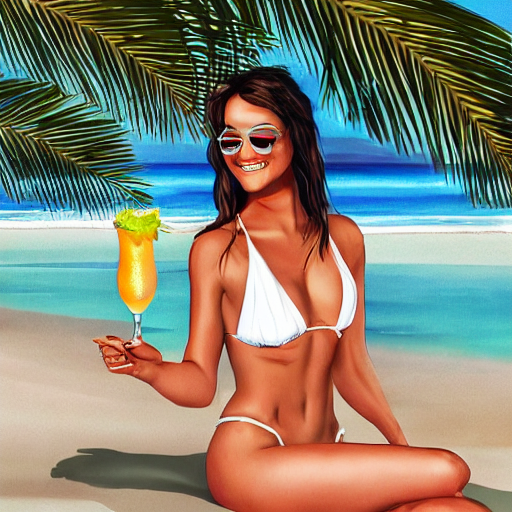

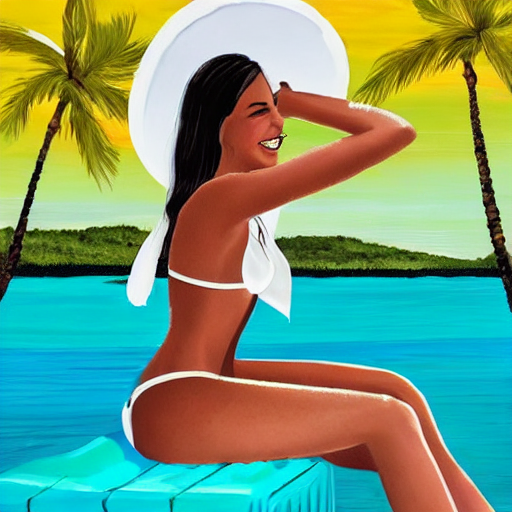

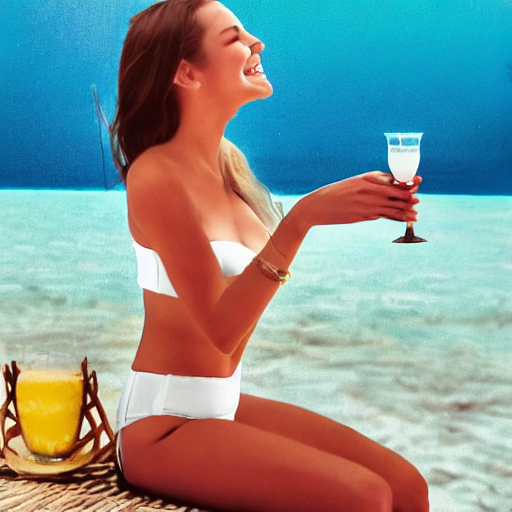

In [23]:
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")
style = '. Illustration'
prompt = f"""
{imgprompt}
"""
prompt += style 

print('Image Prompt: ' + prompt)

#image = pipe(prompt).images[0]
images = pipe(prompt=prompt, num_images_per_prompt=3).images
display(images[0])
display(images[1])
display(images[2])

#display(image)
#"images/bqml_cluster_" + result["id"] + "_0_gen_image.png"
images[0].save("images/bqml_matrix_0_gen_image_graffiti_" + current_time + ".jpg")
images[1].save("images/bqml_matrix_1_gen_image_graffiti_" + current_time + ".jpg")
images[2].save("images/bqml_matrix_2_gen_image_graffiti_" + current_time + ".jpg")

add_record_array(product_sku, product_name, product_description, "bqml_matrix_0_gen_image_graffiti_" + current_time + ".jpg",campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)
add_record_array(product_sku, product_name, product_description, "bqml_matrix_1_gen_image_graffiti_" + current_time + ".jpg",campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)
add_record_array(product_sku, product_name, product_description, "bqml_matrix_2_gen_image_graffiti_" + current_time + ".jpg",campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)


In [25]:
#print(record_array)

## Using Stable Diffusion to modify the original product image slighty ... Maintain most aspects but spicy it up

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


neon lights, Neon flowers and grafitti using watercolor


  0%|          | 0/25 [00:00<?, ?it/s]

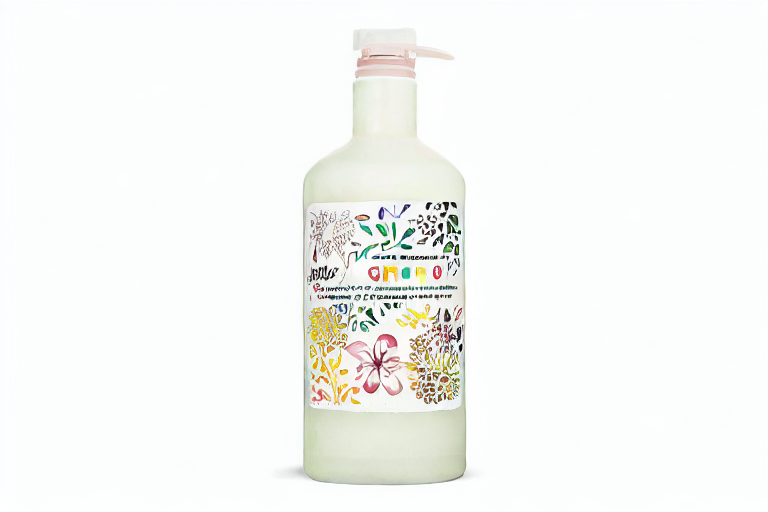

In [27]:
import base64
import glob
import os
from datetime import datetime
from io import BytesIO

import requests
import torch
from google.cloud import aiplatform, storage
from PIL import Image

from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_id_or_path = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id_or_path, torch_dtype=torch.float16
)
pipe = pipe.to(device)

url = "https://www.worldmarket.com/dw/image/v2/BJWT_PRD/on/demandware.static/-/Sites-wm-master-catalog/default/dw8f5dc8a4/images/large/109193_XXX_v1.jpg?sw=1456&sh=1424&sm=fit&sfrm=tif&q=80"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((768, 512))
#init_image = init_image.resize((256, 120))


#prompt = "Tokyo at night with in the rain, neon lights, flying cars using watercolor"
prompt = "neon lights, Neon flowers and grafitti using watercolor"
n_prompt = "ugly, deformed, not detailed, blurred, too much blurred, motion blur"
print(prompt)

#images = pipe(prompt=prompt, image=init_image, strength=0.75, guidance_scale=7.5).images
images = pipe(prompt=prompt, image=init_image, negative_prompt=n_prompt, strength=0.5, num_images_per_prompt=1).images
display(images[0])

images[0].save("images/bqml_matrix_0_gen_mug_" + current_time + ".jpg")

add_record_array(product_sku, product_name, product_description, "bqml_matrix_0_gen_mug_" + current_time + ".jpg" ,campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)


## Using Stable Diffusion to generate artistic images of bottles (Picasso Style)

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

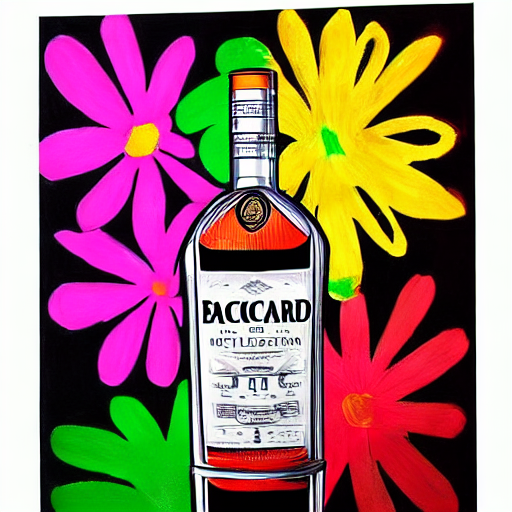

In [29]:


from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

prompt = "A bottle of Rum with flowers, neon colors, sketch artisitc Picasso Style"
image = pipe(prompt).images[0]

display(image)

images[0].save("images/bqml_matrix_0_gen_bottle_neon_" + current_time + ".jpg")

add_record_array(product_sku, product_name, product_description, "bqml_matrix_0_gen_bottle_neon_" + current_time + ".jpg" ,campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)


## Generating a more realist picture now

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

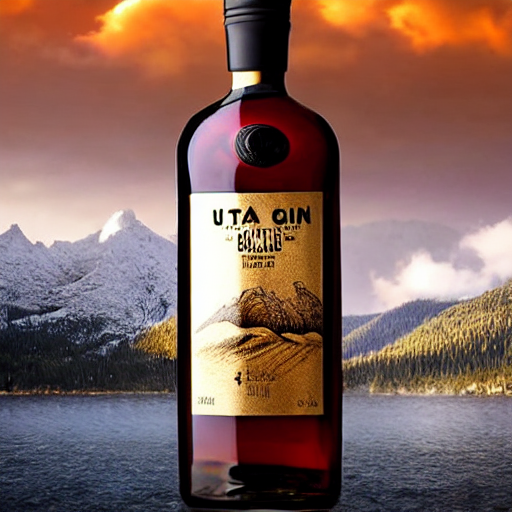

In [31]:
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

prompt = "Ultra realistic bottle of gold rum with snowy and foggy mountains in the background"
#prompt = 'futuristic rendering of a gold bottle of rum  with snowy and foggy mountains in the background, concept, digital art'
image = pipe(prompt).images[0]

display(image)
image.save("images/bqml_matrix_0_bottle_snowy_mountains_" + current_time + ".jpg")
add_record_array(product_sku, product_name, product_description, "bqml_matrix_0_bottle_snowy_mountains_" + current_time + ".jpg" ,campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)


## Stable Diffusion Inpainting

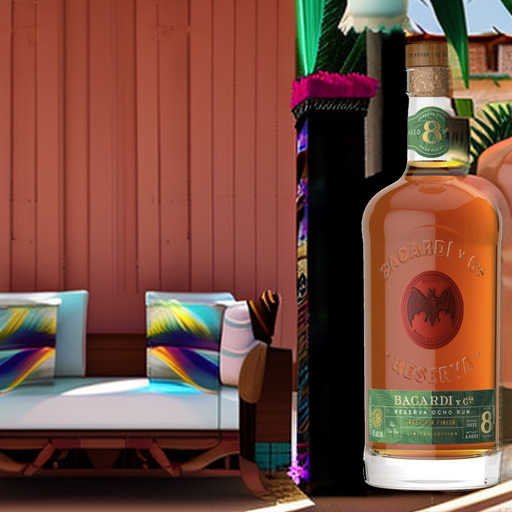

In [3]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "./"
Image(filename = PATH + "caribe_vibes.png", width="100%", height="100%")

In [32]:
# ## Calling custom and remote training model

# import base64
# import glob
# import os
# from datetime import datetime
# from io import BytesIO

# import requests
# import torch
# from google.cloud import aiplatform, storage
# from PIL import Image


# def create_job_name(prefix):
#     user = os.environ.get("USER")
#     now = datetime.now().strftime("%Y%m%d_%H%M%S")
#     job_name = f"{prefix}-{user}-{now}"
#     return job_name


# def download_image(url):
#     response = requests.get(url)
#     return Image.open(BytesIO(response.content))


# def image_to_base64(image, format="JPEG"):
#     buffer = BytesIO()
#     image.save(buffer, format=format)
#     image_str = base64.b64encode(buffer.getvalue()).decode("utf-8")
#     return image_str


# def base64_to_image(image_str):
#     image = Image.open(BytesIO(base64.b64decode(image_str)))
#     return image


# def image_grid(imgs, rows=2, cols=2):
#     w, h = imgs[0].size
#     grid = Image.new("RGB", size=(cols * w, rows * h))
#     for i, img in enumerate(imgs):
#         grid.paste(img, box=(i % cols * w, i // cols * h))
#     return grid


# def deploy_model(model_id, task):
#     model_name = "stable-diffusion-v1"
#     endpoint = aiplatform.Endpoint.create(display_name=f"{model_name}-{task}-endpoint")
#     serving_env = {
#         "MODEL_ID": model_id,
#         "TASK": task,
#     }
#     model = aiplatform.Model.upload(
#         display_name=model_name,
#         serving_container_image_uri=SERVE_DOCKER_URI,
#         serving_container_ports=[7080],
#         serving_container_predict_route="/predictions/diffusers_serving",
#         serving_container_health_route="/ping",
#         serving_container_environment_variables=serving_env,
#     )
#     model.deploy(
#         endpoint=endpoint,
#         machine_type="n1-standard-8",
#         accelerator_type="NVIDIA_TESLA_V100",
#         accelerator_count=1,
#         deploy_request_timeout=1800,
#         service_account=SERVICE_ACCOUNT,
#     )
#     return model, endpoint


# def get_bucket_and_blob_name(filepath):
#     # The gcs path is of the form gs://<bucket-name>/<blob-name>
#     gs_suffix = filepath.split("gs://", 1)[1]
#     return tuple(gs_suffix.split("/", 1))


# def upload_local_dir_to_gcs(local_dir_path, gcs_dir_path):
#     """Uploads files in a local directory to a GCS directory."""
#     client = storage.Client()
#     bucket_name = gcs_dir_path.split("/")[2]
#     bucket = client.get_bucket(bucket_name)
#     for local_file in glob.glob(local_dir_path + "/**"):
#         if not os.path.isfile(local_file):
#             continue
#         filename = local_file[1 + len(local_dir_path) :]
#         gcs_file_path = os.path.join(gcs_dir_path, filename)
#         _, blob_name = get_bucket_and_blob_name(gcs_file_path)
#         blob = bucket.blob(blob_name)
#         blob.upload_from_filename(local_file)
#         print("Copied {} to {}.".format(local_file, gcs_file_path))

# from google.cloud import aiplatform
# aiplatform.init(project='devrel-solutions-carlos-100', location=US_REGION, staging_bucket='ca_stable_diffusion_modelgarden')

# instances = [
#     {"prompt": "A colorful abstract drawing of a sks Bacardi rum"},
#     {"prompt": "A photo of sks Bacardi rum with Tokyo buildings in the background"},
#     {"prompt": "A photorealistic portrait of a Bacardi rum"},
#     {"prompt": "A whimsical illustration of a Bacardi rum bottle with a beach and clouds in the background"},
# ]
# endpoint = aiplatform.Endpoint('2995065276015312896')
# response = endpoint.predict(instances=instances)
# images = [base64_to_image(image) for image in response.predictions]
# image_grid(images)

## Using Google's Image Gen Service

sampleImageSize: 1024
sampleCount: 5
prompt: Commercial photoshoot,green rum bottle photography, a beach in hawaii with the ocean in the background, lens flare, sunset, 4k, dramatic angles
endpointType Prod
seed None
{'instances': [{'prompt': 'Commercial photoshoot,green rum bottle photography, a beach in hawaii with the ocean in the background, lens flare, sunset, 4k, dramatic angles'}], 'parameters': {'sampleImageSize': '1024', 'sampleCount': 5}}
5 images generated
0


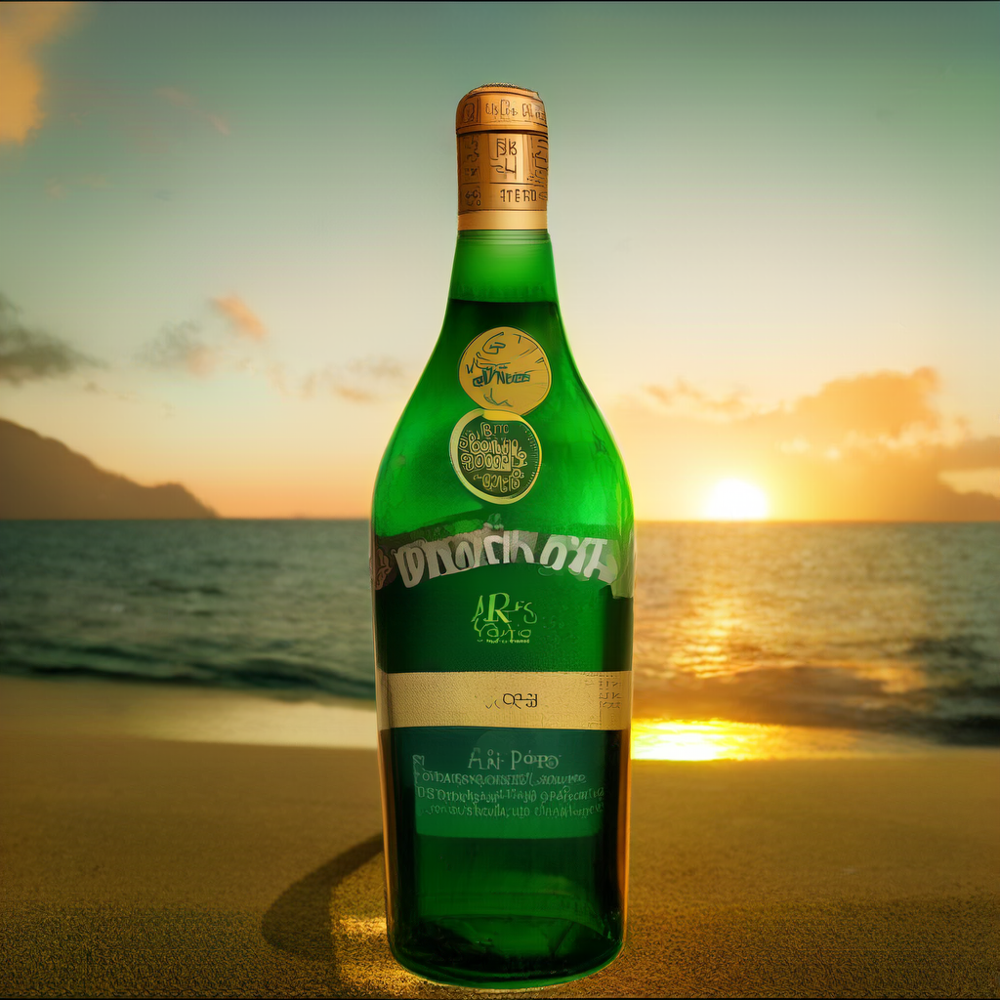


1


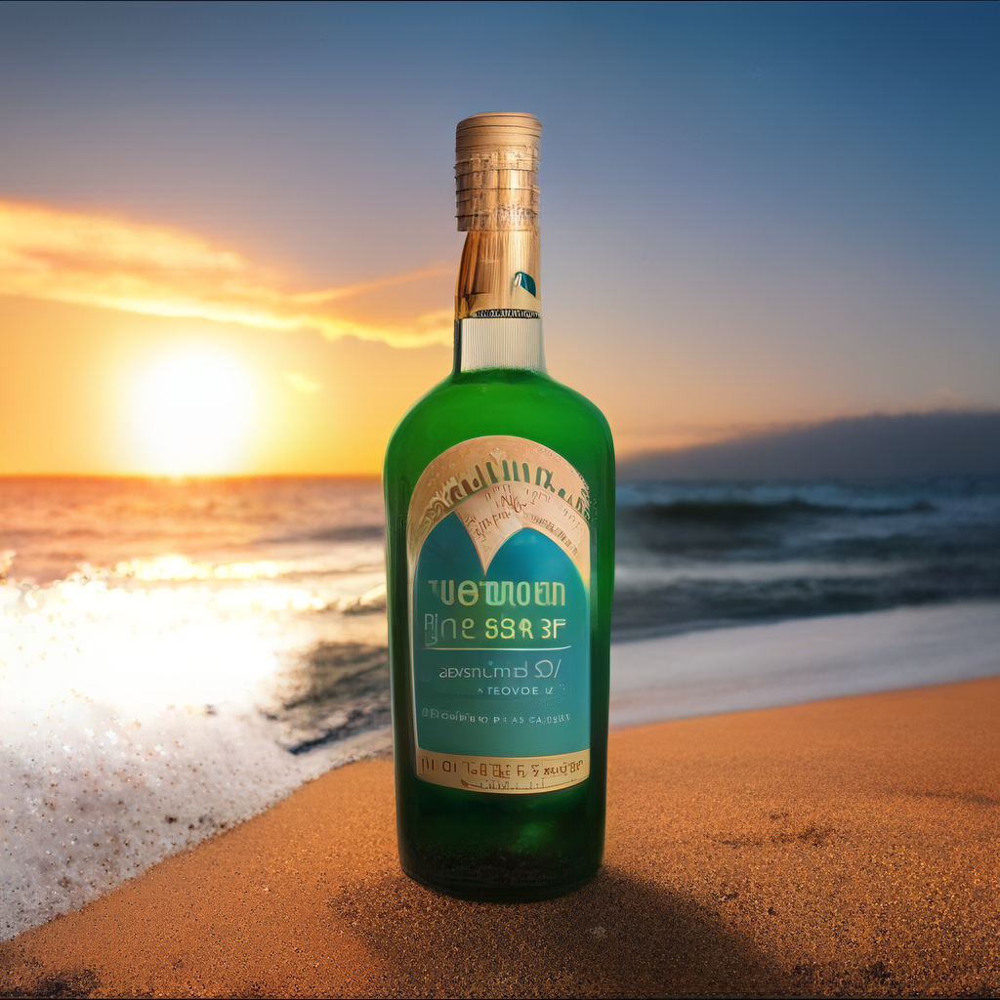


2


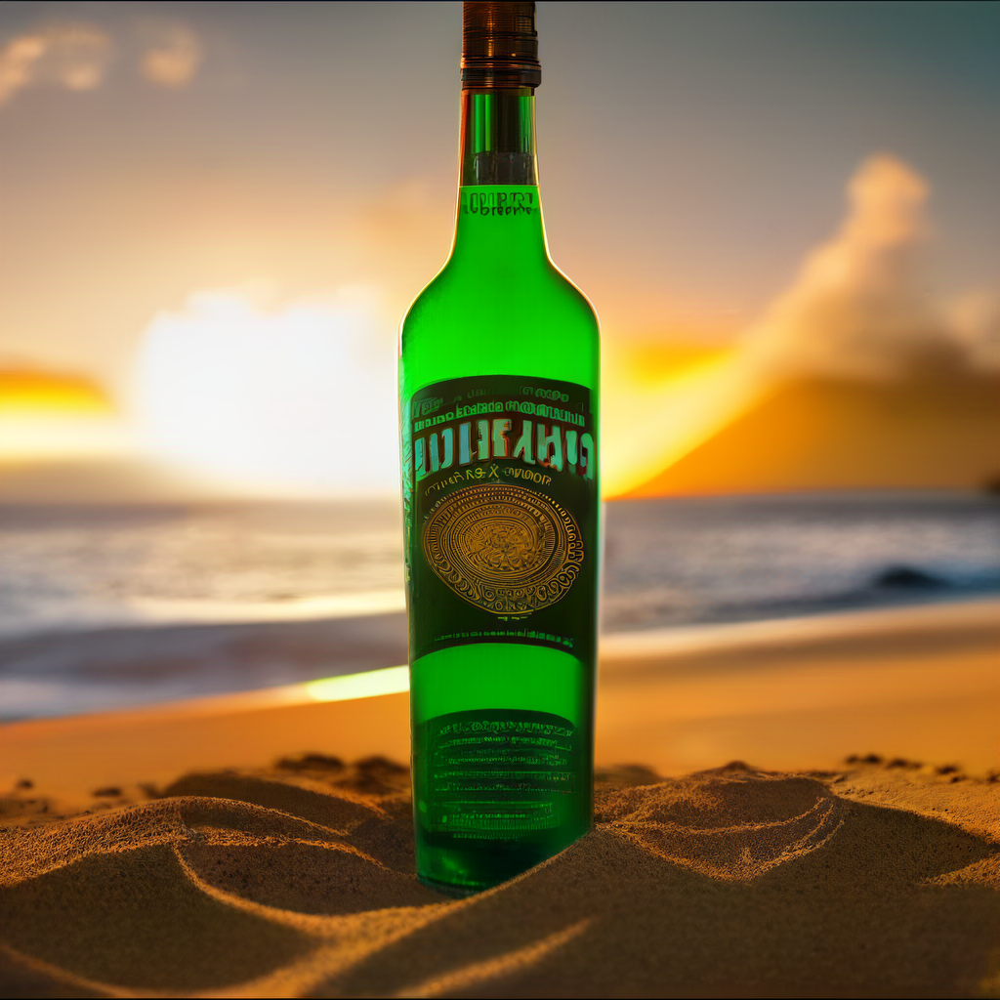


3


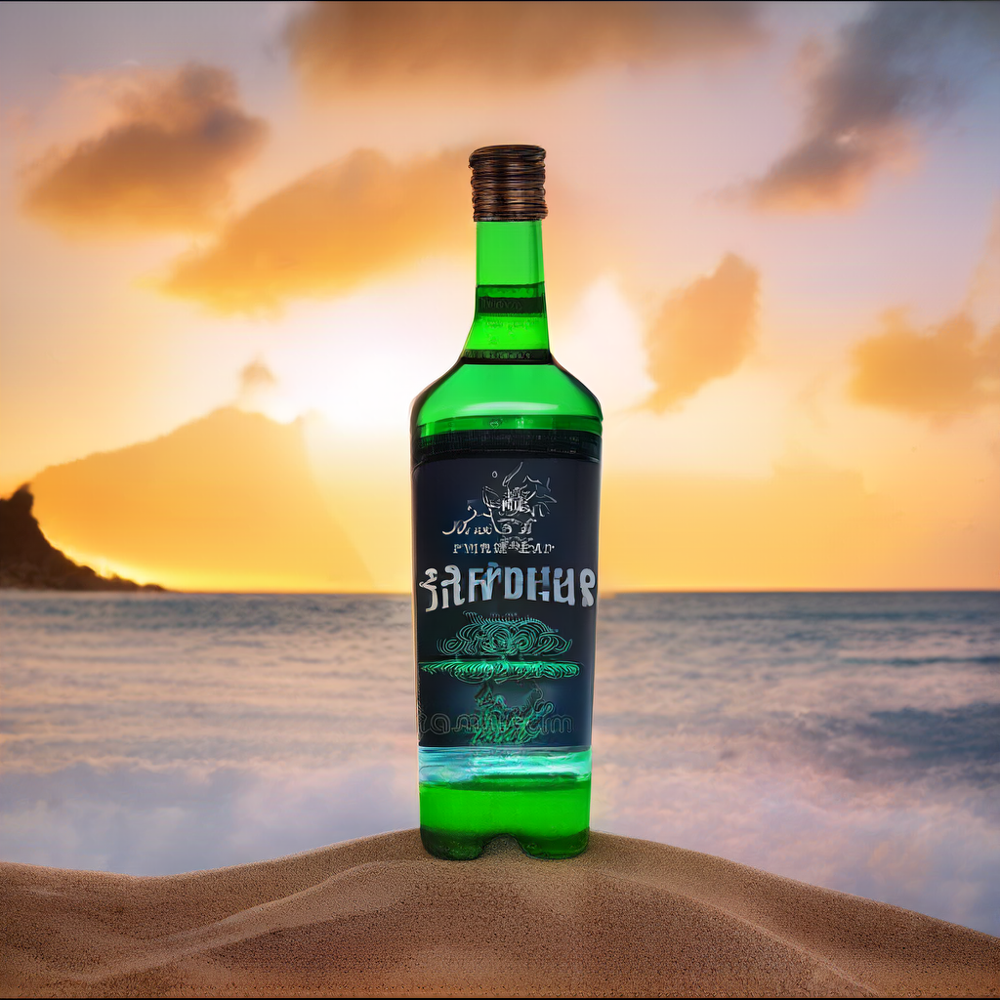


4


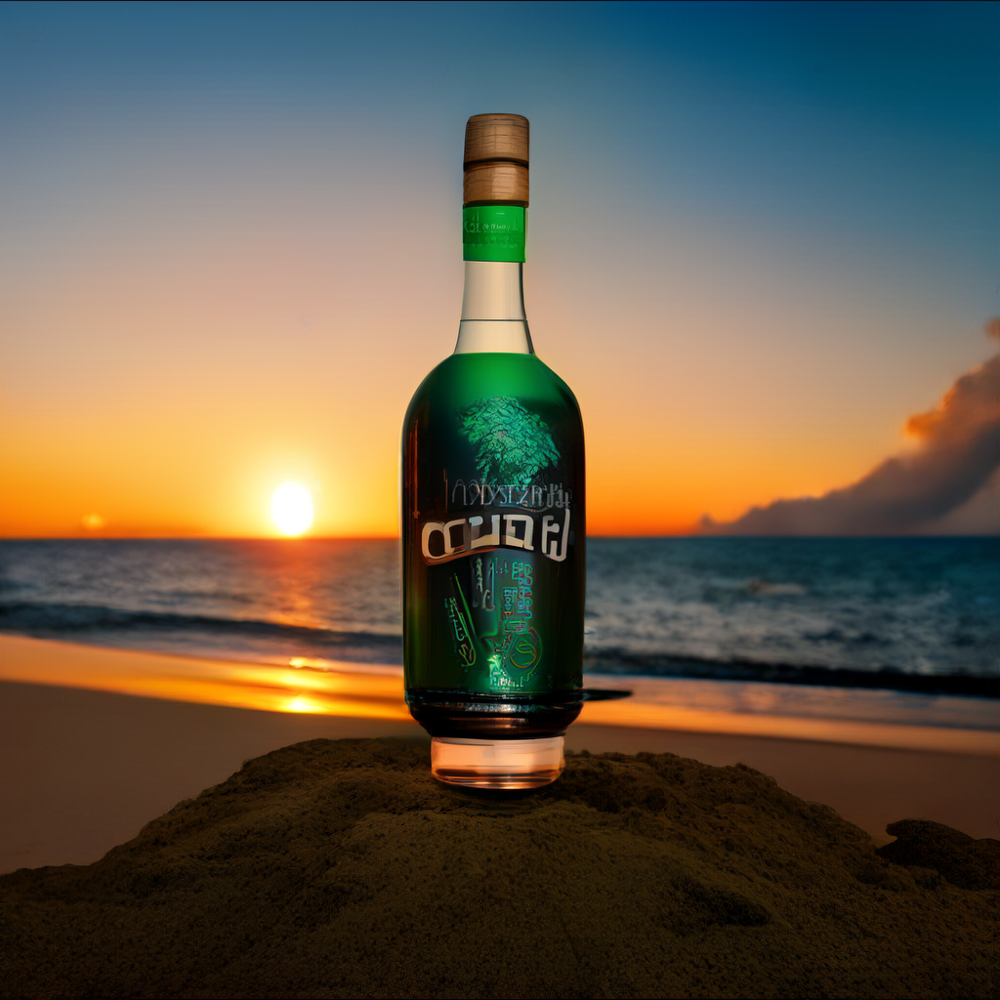

In [33]:
#! gcloud auth login caugusto@google.com
# https://cloud.google.com/vision-ai/docs/priv/generate-images#aspect-ratio

import requests
import json
import time
from IPython import display
import base64

aiplatform.init(project=PROJECT_ID, location=US_REGION, staging_bucket=GCS_BUCKET)

gcloud_token = !gcloud auth print-access-token

gcloud_tokeninfo = requests.get('https://www.googleapis.com/oauth2/v3/tokeninfo?access_token=' + gcloud_token[0]).json()
# print(gcloud_tokeninfo['email'])
# print(gcloud_token[0])

ACCESS_TOKEN = gcloud_token[0]


sampleImageSize = '1024'
sampleCount = 5
endpointType = "Prod" 

# Advanced option, try different the seed numbers
# any random integer number range: (0, 2147483647)
seed = None 

color = ["gold", "blue", "green", "pink", "gray", "purple", "yellow"]
pcolor = random.choice(color)

#prompt = 'A picnic table with colorful and health fruits and snacks. Use a park, birds and blue skies as background.'
prompt = 'Commercial photoshoot,' + pcolor + ' rum bottle photography, a beach in hawaii with the ocean in the background, lens flare, sunset, 4k, dramatic angles'
#prompt = 'Commercial photoshoot, Gold rum bottle, 4k, dramatic angles'
#prompt = 'Commercial photoshoot, Gold rum bottle photography, a beach in hawaii with the ocean in the background, lens flare, sunset, 4k, dramatic angles'

img_prompt = prompt



print('sampleImageSize:', sampleImageSize)
print('sampleCount:', sampleCount)
print('prompt:', prompt)
print('endpointType', endpointType)
print('seed', seed)


def image_gen_model(prompt, sampleImageSize, sampleCount, endpointType='Prod', seed=None):
    headers = {
      'Authorization': f'Bearer {ACCESS_TOKEN}',
      'Content-Type': 'application/json; charset=UTF-8'
  }
  # Advanced option, try different the seed numbers
  # any random integer number range: (0, 2147483647)
    if seed==None:
        data = {"instances": [{"prompt": prompt}],"parameters": {"sampleImageSize": sampleImageSize,"sampleCount": sampleCount}}
    else:
    # Use & provide a seed, if possible, so that we can reproduce the results when needed.
        data = {"instances": [{"prompt": prompt}],"parameters": {"sampleImageSize": sampleImageSize,"sampleCount": sampleCount, "seed": seed}}

    print(data)
    response = requests.post('https://'+llm_location+'-aiplatform.googleapis.com/v1/projects/'+ project_id + '/locations/' + llm_location + '/publishers/google/models/imagegeneration:predict', data=json.dumps(data), headers=headers)
    return response



def generate_images(prompt):
    response = image_gen_model(
    prompt,
    sampleImageSize,
    sampleCount,
    endpointType,
    seed
  )
    json_response = json.loads(response.text)

    try:
        predictions = json_response['predictions']
        return predictions
    except:
        print("An error occured calling the API.")
        print("1. Check if response was not blocked based on policy violation, check if the UI behaves the same way...")
        print("2. Try a different prompt to see if that was the problem.\n")
        print(response.text)



def display_images(predictions):
    scale = 0.3
    width = int(float(sampleImageSize)*scale)
    height = int(float(sampleImageSize)*scale)
    for index, key in enumerate(predictions):
        print(index)
        display.display(display.Image(base64.b64decode(predictions[index]['bytesBase64Encoded']), width = width, height = height))
        print()

image_predictions = generate_images(prompt)
print(f"{len(image_predictions)} images generated")
display_images(image_predictions)

img_list = []

for index, key in enumerate(image_predictions):
    #print(index)
    filename = 'bqml_matrix_gen_bottle_gold_' +  str(index) + '_' + current_time +'.jpg'
    destination_blob_name='images/' + filename 
    imgdata = base64.b64decode(image_predictions[index]['bytesBase64Encoded'])
    f = open(destination_blob_name, "wb")
    f.write(imgdata)
    f.close()
    add_record_array(product_sku, product_name, product_description, filename ,campaign_id, campaign_time, email_campaign, campaign_owner, prompt, customer_name)

    #ret_img_upload = upload_blob(bucket_name, destination_blob_name, destination_blob_name)
    #img_list.append(ret_img_upload)
    #print(ret_img_upload)

#final_img_list = "\n".join(img_list)
#print(final_img_list)
#thumbnail_url = ret_img_upload

## Add logo to all pictures

In [ ]:
# importing the library
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

    
img_dir='./images'


final_record_array = []

# def add_record_array(product_sku, product_name, product_description, file_name,campaign_id, campaign_time, email_campaign, campaign_owner, imgprompt, customer_name):
#     file_url=img_uri+file_name
#     record_array.append([file_name, product_sku, product_name, product_description, file_url,campaign_id, campaign_time, email_campaign, campaign_owner, imgprompt, customer_name])
    
for item in record_array:
    fullpath=os.path.join(img_dir, item[0])
        
    image=Image.open(fullpath)
    logo=Image.open("./logo_tiny2.jpg")
    image.show()
    logo.show()
    plt.imshow(image)

    # add watermark
    copied_image = image.copy()
    # base image
    copied_image.paste(logo)
    # pasted the crop image onto the base image
    plt.imshow(copied_image)
    newfile='logo_' + item[0]
    copied_image
    copied_image.save(img_dir + '/' + newfile )
    final_url=img_uri+newfile
    final_record_array.append([item[0],item[1], item[2], item[3], final_url ,item[5], item[6], item[7], item[8], item[9], item[10]])

## Upload Images to GCS

In [35]:
from google.cloud import _http
from google.cloud import storage
from google.cloud.client import ClientWithProject
from xml.etree import ElementTree as ET
from IPython.display import HTML
from matplotlib import pyplot as plt
import pprint
import pandas as pd
import gzip
import json
import numpy as np
import os
import math
import json
import IPython
#import pandas_gbq

from google.cloud import storage
import os



def upload_blob(bucket_name, source_file_name, destination_blob_name):
    """Uploads a file to the bucket."""
    # The ID of your GCS bucket
    # bucket_name = "your-bucket-name"
    # The path to your file to upload
    # source_file_name = "local/path/to/file"
    # The ID of your GCS object
    # destination_blob_name = "storage-object-name"

    storage_client = storage.Client()
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(destination_blob_name)

    # Optional: set a generation-match precondition to avoid potential race conditions
    # and data corruptions. The request to upload is aborted if the object's
    # generation number does not match your precondition. For a destination
    # object that does not yet exist, set the if_generation_match precondition to 0.
    # If the destination object already exists in your bucket, set instead a
    # generation-match precondition using its generation number.
    generation_match_precondition = 0

    blob.upload_from_filename(source_file_name)

    print(
        f"File {source_file_name} uploaded to {destination_blob_name}."
    )
    
    file_url = 'https://storage.cloud.google.com/' + bucket_name + '/' + destination_blob_name
    
    return file_url



# save ocr text to GCS as well
def upload_string(bucket_name, destination_blob_name, data_from_flowfile_as_string):
    """Uploads a file to the bucket."""
    storage_client = storage.Client()
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(destination_blob_name)
    blob.upload_from_string(data_from_flowfile_as_string)

    print(
        f"File {destination_blob_name} created successfully."
    )
    
    file_url = 'https://storage.cloud.google.com/' + bucket_name + '/' + SUBDIR + '/' + destination_blob_name
    return file_url


img_dir='./images'


    
for file in os.listdir(img_dir):
    if file.endswith(".jpg"):
        fullpath=os.path.join(img_dir, file)
        source_file_name = fullpath
        destination_blob_name = SUBDIR + '/generated/' + os.path.basename(source_file_name)
        #print(destination_blob_name)
        file_url = upload_blob(bucket_name, source_file_name, destination_blob_name)
        print(file_url)


# Create the pandas DataFrame
img_df = pd.DataFrame(final_record_array, columns=['file_name','product_sku', 'product_name', 'product_description', 'file_url' , 'campaign_id', 'campaign_time', 'email_campaign', 'campaign_owner', 'imgprompt', 'customer_name'])


# print dataframe.
#df


File ./images/logo_bqml_matrix_gen_bottle_gold_2_1686148508_3378017.jpg uploaded to bacardi/generated/logo_bqml_matrix_gen_bottle_gold_2_1686148508_3378017.jpg.
https://storage.cloud.google.com/caugusto_genai/bacardi/generated/logo_bqml_matrix_gen_bottle_gold_2_1686148508_3378017.jpg
File ./images/logo_bqml_matrix_gen_bottle_gold_3_1686148508_3378017.jpg uploaded to bacardi/generated/logo_bqml_matrix_gen_bottle_gold_3_1686148508_3378017.jpg.
https://storage.cloud.google.com/caugusto_genai/bacardi/generated/logo_bqml_matrix_gen_bottle_gold_3_1686148508_3378017.jpg
File ./images/logo_bqml_matrix_0_gen_bottle_neon_1686148508_3378017.jpg uploaded to bacardi/generated/logo_bqml_matrix_0_gen_bottle_neon_1686148508_3378017.jpg.
https://storage.cloud.google.com/caugusto_genai/bacardi/generated/logo_bqml_matrix_0_gen_bottle_neon_1686148508_3378017.jpg
File ./images/logo_bqml_matrix_gen_bottle_gold_4_1686148508_3378017.jpg uploaded to bacardi/generated/logo_bqml_matrix_gen_bottle_gold_4_16861485

## Show all Generated Images

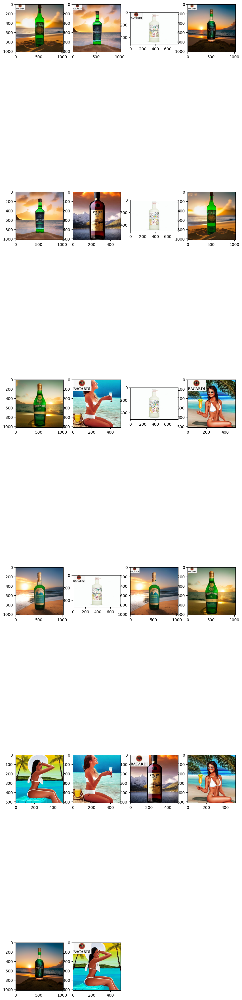

In [36]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = []
for img_path in glob.glob('./images/*.jpg'):
    images.append(mpimg.imread(img_path))

#print(images)
plt.figure(figsize=(10,50))
columns = 4

for i, image in enumerate(images):
    plt.subplot(int(len(images) / columns + 1), columns, i + 1)
    plt.imshow(image)

## Insert Metadata into BigQuery

In [37]:
# %%bigquery 

# create or replace table caugusto.bacardi_imgs(
# file_name string,
# product_sku INT64,
# product_name string,
# product_description string,
# file_url string,
# campaign_id INT64,
# campaign_time TIMESTAMP,
# email_campaign string,
# campaign_owner string,
# imgprompt string,
# customer_name string
# );

In [38]:
import datetime

from google.cloud import bigquery
import pandas
import pytz

# Construct a BigQuery client object.
client = bigquery.Client()

    
job_config = bigquery.LoadJobConfig(
    # Specify a (partial) schema. All columns are always written to the
    # table. The schema is used to assist in data type definitions.
    schema=[
        # Specify the type of columns whose type cannot be auto-detected. For
        # example the "title" column uses pandas dtype "object", so its
        # data type is ambiguous.
        bigquery.SchemaField("file_name", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("product_sku", bigquery.enums.SqlTypeNames.INT64),
        bigquery.SchemaField("product_name", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("product_description", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("file_url", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("campaign_id", bigquery.enums.SqlTypeNames.INT64),
        bigquery.SchemaField("campaign_time", bigquery.enums.SqlTypeNames.TIMESTAMP),
        bigquery.SchemaField("email_campaign", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("campaign_owner", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("imgprompt", bigquery.enums.SqlTypeNames.STRING),
        bigquery.SchemaField("customer_name", bigquery.enums.SqlTypeNames.STRING),
    ],                         
    # Optionally, set the write disposition. BigQuery appends loaded rows
    # to an existing table by default, but with WRITE_TRUNCATE write
    # disposition it replaces the table with the loaded data.
    write_disposition="WRITE_APPEND",
)


job = client.load_table_from_dataframe(
    img_df, table_id, job_config=job_config
)  # Make an API request.
job.result()  # Wait for the job to complete.

table = client.get_table(table_id)  # Make an API request.
print(
    "Table now has {} rows and {} columns to {}".format(
        table.num_rows, len(table.schema), table_id)
)


Table now has 43 rows and 11 columns to caugusto.bacardi_imgs


#### https://lookerstudio.google.com/c/u/0/reporting/9e695ab1-2f64-4b98-b965-b8c588198beb/page/HV2QD/edit